In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import xgboost
%matplotlib inline

In [5]:
data_test = pd.read_csv("D:\\MLData\\kaggle\\housePricePrediction\\test.csv")

data_train = pd.read_csv("D:\\MLData\\kaggle\\housePricePrediction\\train.csv")

In [6]:
data_train.shape, data_test.shape

((1460, 81), (1459, 80))

In [7]:
for i in data_train.columns:
    if i not in data_test.columns:
        print(i)

SalePrice


In [8]:
sale_price = data_train['SalePrice']

In [9]:
sale_price_log = np.log(1+sale_price)

C:\Users\DK Singh\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


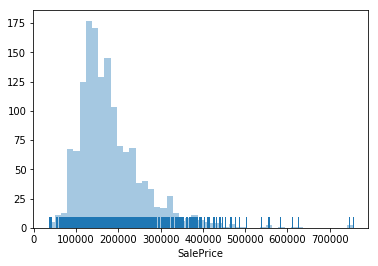

In [10]:
sns.distplot(sale_price, kde=False, rug=True)

C:\Users\DK Singh\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


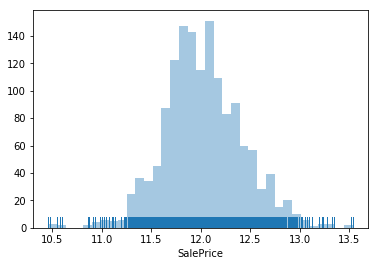

In [11]:
sns.distplot(sale_price_log, kde=False, rug=True)

In [12]:
data_train.drop('SalePrice', axis=1, inplace=True)

In [13]:
all_data = pd.concat((data_train, data_test)).reset_index(drop=True) 

In [14]:
pd.set_option("display.max_rows", 10000000)
pd.set_option("display.max_columns", 10000000)

In [15]:
all_data[['MSSubClass', 'LotFrontage']]

,MSSubClass,LotFrontage
0,60,65.0
1,20,80.0
2,60,68.0
3,70,60.0
4,60,84.0
5,50,85.0
6,20,75.0
7,60,NaN
8,50,51.0
9,190,50.0


In [16]:
log_columns =['MSSubClass', 'LotFrontage', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF','TotalBsmtSF', '1stFlrSF', '2ndFlrSF','LowQualFinSF', 'GrLivArea',  'BsmtFullBath', 'TotRmsAbvGrd', 'GarageArea']

In [17]:
all_data[log_columns] = np.log1p(all_data[log_columns])

In [ ]:
#p = np.log(t.MSSubClass)

In [ ]:
#t[['MSSubClass', 'LotFrontage']] = t[np.log(t.MSSubClass), np.log(t.LotFrontage)] 

In [ ]:
#all_data[log_columns]

In [ ]:
#all_data[['MSSubClass', 'LotFrontage', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
'TotalBsmtSF', '1stFlrSF', '2ndFlrSF','LowQualFinSF', 'GrLivArea',  'BsmtFullBath', 'TotRmsAbvGrd', 'GarageArea']]

In [ ]:
#sns.pairplot(all_data)

In [ ]:
#sns.pairplot(all_data)

In [ ]:
#all_data.isnull().sum()

In [20]:
all_data.drop(['PoolQC', 'Fence', 'MiscFeature', 'Alley'], axis=1, inplace=True) 

In [21]:
#data['TotalBsmtSF'] = 
#data['BsmtUnfSF'] = 
#data['BsmtFinSF2'] = 
#data['BsmtFinSF1'] =
data['BsmtExposure'] = data['BsmtExposure'].fillna('NA')
data['BsmtFinType1'] = data['BsmtFinType1'].fillna('NA')
data['BsmtFinType2'] = data['BsmtFinType2'].fillna('NA')
data['BsmtCond']=data['BsmtCond'].fillna('NA')
data['BsmtQual']=data['BsmtQual'].fillna('NA') 

NameError: name 'data' is not defined

In [22]:
all_data.GarageType = all_data.GarageType.fillna('NA')
cmedian = all_data[all_data.GarageType=='Detchd'].GarageArea.median()
print("GarageArea median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageArea'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageArea'].fillna(cmedian)
all_data.GarageArea = all_data.GarageArea.fillna(0)

cmedian = all_data[all_data.GarageType=='Detchd'].GarageCars.median()
print("GarageCars median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageCars'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageCars'].fillna(cmedian)
all_data.GarageCars = all_data.GarageCars.fillna(0)

cmedian = all_data[all_data.GarageType=='Detchd'].GarageYrBlt.median()
print("GarageYrBlt median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageYrBlt'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                          'GarageYrBlt'].fillna(cmedian)
all_data.GarageYrBlt = all_data.GarageYrBlt.fillna(0)

# Group by GarageType and fill missing value with mode where GarageType=='Detchd' and 'NA' for the others
cmode = all_data[all_data.GarageType=='Detchd'].GarageFinish.mode()[0]
print("GarageFinish mode of Type Detchd:", cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageFinish'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                           'GarageFinish'].fillna(cmode)
all_data.GarageFinish = all_data.GarageFinish.fillna('NA')

cmode = all_data[all_data.GarageType=='Detchd'].GarageQual.mode()[0]
print("GarageQual mode of Type Detchd: %s" %cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageQual'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageQual'].fillna(cmode)
all_data.GarageQual = all_data.GarageQual.fillna('NA')

cmode = all_data[all_data.GarageType=='Detchd'].GarageCond.mode()[0]
print("GarageCond mode of Type Detchd:", cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageCond'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageCond'].fillna(cmode)
all_data.GarageCond = all_data.GarageCond.fillna('NA')


GarageArea median of Type Detchd: 5.992712987207275
GarageCars median of Type Detchd: 2.0
GarageYrBlt median of Type Detchd: 1962.0
GarageFinish mode of Type Detchd: Unf
GarageQual mode of Type Detchd: TA
GarageCond mode of Type Detchd: TA


In [23]:
all_data['Utilities'].value_counts()

AllPub    2916
NoSeWa       1
Name: Utilities, dtype: int64

In [24]:
all_data.drop('Utilities', axis=1, inplace=True)


In [25]:
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & 
             (all_data.BsmtExposure.isnull()) & 
             (all_data.TotalBsmtSF>0), 'BsmtExposure'] = 'Av'
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & 
             (all_data.BsmtQual.isnull()) & 
             (all_data.TotalBsmtSF>0), 'BsmtQual'] = 'TA'
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & (all_data.BsmtCond.isnull()) & (all_data.TotalBsmtSF>0), 'BsmtCond'] = 'TA'
all_data.loc[(all_data.BsmtFinSF2>0) & (all_data.BsmtFinType2.isnull()) , 'BsmtFinType2'] = 'Unf'
all_data.loc[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull()), 'BsmtFinSF2'] = 354.0
all_data.loc[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull()), 'BsmtUnfSF'] = 0.0
print("Rest cases where Cond is Null", (all_data[all_data.BsmtCond.isnull()]).shape[0], '\n')
print('Others categories basement features are Null when Cond is Null:\n',
      (all_data[all_data.BsmtCond.isnull()][['BsmtQual', 'BsmtCond', 'BsmtExposure',
                                             'BsmtFinType1' , 'BsmtFinType2']]).isnull().sum())
print('\nOthers numerics basement features are Null or Zero when Cond is Null:\n',
      all_data[all_data.BsmtCond.isnull()][['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF' ,'TotalBsmtSF',
                                            'BsmtFullBath', 'BsmtHalfBath']].sum())
print("\nThe particular cases where's numeric basement features see below are Null were included in the previous groups:") 
#display(all_data[all_data.BsmtFullBath.isnull()][feat])

# So, we update these Zero or NA according to their dictionary:
nulls_cols = {'BsmtExposure': 'NA', 'BsmtFinType2': 'NA', 'BsmtQual': 'NA', 'BsmtCond': 'NA', 'BsmtFinType1': 'NA',
              'BsmtFinSF1': 0, 'BsmtFinSF2': 0, 'BsmtUnfSF': 0 ,'TotalBsmtSF': 0, 'BsmtFullBath': 0, 'BsmtHalfBath': 0}

all_data = all_data.fillna(value=nulls_cols)

#print('\nFinal Check if all nulls basement features are treated:', all_data[feat].isnull().sum().sum())


Rest cases where Cond is Null 79 

Others categories basement features are Null when Cond is Null:
 BsmtQual        79
BsmtCond        79
BsmtExposure    79
BsmtFinType1    79
BsmtFinType2    79
dtype: int64

Others numerics basement features are Null or Zero when Cond is Null:
 BsmtFinSF1      0.0
BsmtFinSF2      0.0
BsmtUnfSF       0.0
TotalBsmtSF     0.0
BsmtFullBath    0.0
BsmtHalfBath    0.0
dtype: float64

The particular cases where's numeric basement features see below are Null were included in the previous groups:


In [26]:
all_data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            4
LotFrontage       486
LotArea             0
Street              0
LotShape            0
LandContour         0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         1
Exterior2nd         1
MasVnrType         24
MasVnrArea         23
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual            0
BsmtCond            0
BsmtExposure        0
BsmtFinType1        0
BsmtFinSF1          0
BsmtFinType2        0
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFinSF        0
GrLivArea           0
BsmtFullBa

In [27]:
all_data['MasVnrType'] = all_data['MasVnrType'].fillna('None')
all_data['MasVnrArea'] = all_data['MasVnrArea'].fillna(0.0)

In [28]:
all_data['LotFrontage']=all_data['LotFrontage'].fillna(all_data['LotFrontage'].mean())

In [29]:
all_data['FireplaceQu']=all_data['FireplaceQu'].fillna('NA') 

In [30]:
all_data[all_data['MSZoning'].isnull()][['MSZoning', 'MSSubClass']] 

,MSZoning,MSSubClass
1915,NaN,3.433987
2216,NaN,3.044522
2250,NaN,4.262680
2904,NaN,3.044522


In [31]:
all_data['MSZoning'][2216] = 'RL'
all_data['MSZoning'][2904] = 'RL'
all_data['MSZoning'][1915] = 'RM'
all_data['MSZoning'][2250] = 'RM'

C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\D

In [32]:
all_data[all_data['SaleType'].isnull()][['YrSold', 'SaleType']]

,YrSold,SaleType
2489,2007,NaN


In [33]:
all_data['SaleType'].value_counts()

WD       2525
New       239
COD        87
ConLD      26
CWD        12
ConLI       9
ConLw       8
Oth         7
Con         5
Name: SaleType, dtype: int64

In [34]:
all_data[all_data['SaleType'].isnull()][['YrSold', 'SaleType']]

,YrSold,SaleType
2489,2007,NaN


AttributeError: module 'seaborn' has no attribute 'scatterplot'

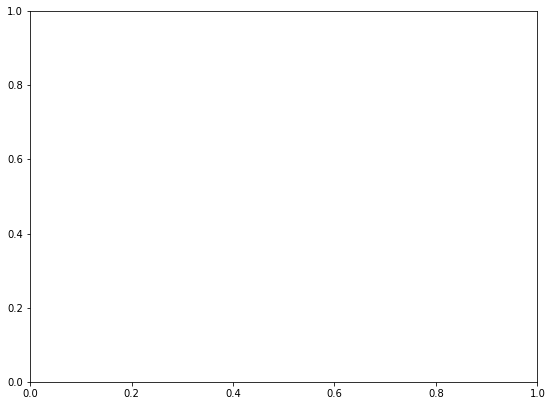

In [35]:
import seaborn as sns
fig = plt.figure(figsize=(20,15))
fig1 =  fig.add_subplot(221)
sns.scatterplot(y = np.array(all_data[all_data['SaleType'].notna()].SaleType), x = np.array(all_data[all_data['SaleType'].notna()].YrSold))

In [36]:
all_data[all_data['YrSold']==2007]['SaleType'].value_counts()

WD       568
New       89
COD       18
CWD       11
Oth        2
ConLw      2
Con        1
Name: SaleType, dtype: int64

In [37]:
all_data['SaleType'][2489] = 'WD'

C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [38]:
all_data.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'Open

In [39]:
all_data[all_data['Functional'].notnull()].Functional.value_counts()

Typ     2717
Min2      70
Min1      65
Mod       35
Maj1      19
Maj2       9
Sev        2
Name: Functional, dtype: int64

In [40]:
all_data['Functional'] = all_data['Functional'].fillna('Typ')

In [41]:
all_data[all_data['KitchenQual'].isnull()][['KitchenQual', 'OverallQual']] 
all_data[all_data['OverallQual']==5].KitchenQual.value_counts()

Series([], Name: KitchenQual, dtype: int64)

In [ ]:
fig = plt.figure(figsize=(20,15))
fig1 =  fig.add_subplot(221)
sns.scatterplot(y = np.array(all_data[all_data['KitchenQual'].notna()].KitchenQual), x = np.array(all_data[all_data['KitchenQual'].notna()].OverallQual))

In [42]:
all_data['KitchenQual'] = all_data['KitchenQual'].fillna('TA')

In [43]:
all_data[all_data['Exterior1st'].isnull()][['Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond']] 

,Exterior1st,Exterior2nd,ExterQual,ExterCond
2151,NaN,NaN,TA,TA


In [44]:
all_data[(all_data['ExterQual']=='TA') & (all_data['ExterCond']=='TA') & (all_data['OverallQual']==5)].Exterior2nd.value_counts()

Series([], Name: Exterior2nd, dtype: int64)

In [45]:
all_data.Electrical.value_counts()

SBrkr    2671
FuseA     188
FuseF      50
FuseP       8
Mix         1
Name: Electrical, dtype: int64

In [46]:
all_data['Electrical'] = all_data['Electrical'].fillna('SBrkr') 

In [47]:
all_data.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      1
Exterior2nd      1
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd

In [48]:
all_data['Exterior1st'] = all_data['Exterior1st'].fillna('Wd Sdng') 
all_data['Exterior2nd'] = all_data['Exterior2nd'].fillna('Wd Sdng') 

In [49]:
train_data = all_data.iloc[0:1460,:]
test_data = all_data.iloc[1461:, :]

In [50]:
train_data.shape, test_data.shape

((1460, 75), (1458, 75))

In [51]:
categorical_cols = all_data.select_dtypes(include=['object']).columns

In [52]:
categorical_cols

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
       'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

In [53]:
all_data_dummy = all_data
for i in categorical_cols:
    p = pd.get_dummies(all_data_dummy[i], prefix=i+'__' ,drop_first=True)
    all_data_dummy = pd.concat([all_data_dummy,p],axis=1) 
all_data_dummy.drop(categorical_cols, axis=1, inplace=True)

In [55]:
all_data.shape

(2919, 75)

In [56]:
all_data_dummy.drop('Id', axis=1, inplace=True)

In [62]:
all_data_dummy.shape

(2919, 245)

In [58]:
def normalize_data(data): 
    # scale features using statistics that are robust to outliers
    # turns out that sklearn works very well 
    rs = sklearn.preprocessing.RobustScaler()
    rs.fit(data)
    data = rs.transform(data)
    #div = np.percentile(data,0.75,axis=0) - np.percentile(data,0.25,axis=0)
    #np.place(div, div < 1., 1.)
    #print(div)
    #data = (data-np.median(data,axis=0))/div
    return data

In [63]:
import sklearn
all_data_normalized = normalize_data(all_data_dummy)


In [66]:
all_data_normalized.shape

(2919, 245)

In [67]:
train_data_X = np.matrix(all_data_normalized[0:1460,:])
#train_data_y = np.matrix(all_data_dummy.iloc[0:1460,:])
test_data_X = np.matrix(all_data_normalized[1460:, :])
train_data_y = np.matrix(sale_price_log)

In [ ]:
#all_data_dummy.iloc[0:1460,:-1]

In [ ]:
#train_data_X

In [ ]:
#train_data_X.shape, test_data_X.shape

In [ ]:
#import xgboost
#regressor=xgboost.XGBRegressor()
#from sklearn.model_selection import RandomizedSearchCV
#n_estimators = [100, 500] 
#max_depth = [5, 10, 15]
#booster=['gbtree','gblinear']
#learning_rate=[0.1,0.20]
#min_child_weight=[1,2,3,4]
#base_score=[0.25,0.5,0.75,1] 

# Define the grid of hyperparameters to search
#hyperparameter_grid = {
#    'n_estimators': n_estimators,
#    'max_depth':max_depth,
#    'learning_rate':learning_rate,
#    'min_child_weight':min_child_weight,
#    'booster':booster,
#    'base_score':base_score
#    }
#random_cv = RandomizedSearchCV(estimator=regressor,
#            param_distributions=hyperparameter_grid,
#            cv=5, n_iter=50,
#            scoring = 'neg_mean_absolute_error',n_jobs = 4,
#            verbose = 5, 
#            return_train_score = True,
#            random_state=42)

In [ ]:
#sale_price

In [112]:
#random_cv.fit(train_data_X,train_data_y.reshape(1460,1))

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:   26.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:  1.7min
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:  4.0min
[Parallel(n_jobs=4)]: Done 250 out of 250 | elapsed:  6.6min finished


[21:25:30] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5, error_score='raise',
          estimator=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1),
          fit_params=None, iid=True, n_iter=50, n_jobs=4,
          param_distributions={'n_estimators': [100, 500], 'max_depth': [5, 10, 15], 'learning_rate': [0.1, 0.2], 'min_child_weight': [1, 2, 3, 4], 'booster': ['gbtree', 'gblinear'], 'base_score': [0.25, 0.5, 0.75, 1]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score=True, scoring='neg_mean_absolute_error',
          verbose=5)

In [170]:
#regressor=xgboost.XGBRegressor(base_score=0.25, booster='gbtree', colsample_bylevel=1,
#       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
#       max_depth=2, min_child_weight=1, missing=None, n_estimators=900,
#       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
#       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
#       silent=True, subsample=1)

In [141]:
#random_cv.fit(train_data_X,train_data_y)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:   12.4s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:  1.4min
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:  3.5min
[Parallel(n_jobs=4)]: Done 250 out of 250 | elapsed:  5.5min finished


[15:03:54] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5, error_score='raise',
          estimator=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0,
       importance_type='gain', learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=None, subsample=1, verbosity=1),
          fit_params=None, iid=True, n_iter=50, n_jobs=4,
          param_distributions={'n_estimators': [100, 500], 'max_depth': [5, 10, 15], 'learning_rate': [0.1, 0.2], 'min_child_weight': [1, 2, 3, 4], 'booster': ['gbtree', 'gblinear'], 'base_score': [0.25, 0.5, 0.75, 1]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score=True, scoring='neg_mean_absolute_error',
          verbose=5)

In [55]:
#random_cv.score(train_data_X,train_data_y.reshape(1460,1)) 

-6112.0015999571915

In [78]:
#random_cv.score(train_data_X,train_data_y.reshape(1460,1)) 

-0.008842076387800539

In [113]:
#random_cv.score(train_data_X,train_data_y.reshape(1460,1)) 

-0.01479739476963779

In [114]:
#y_pred = np.exp(random_cv.predict(np.matrix(test_data_X))) - 1

In [81]:
#y_pred.shape

(1459,)

In [117]:
#pred=pd.DataFrame(y_pred)
#sub_data = pd.read_csv("D:\\MLData\\kaggle\\housePricePrediction\\sample_submission.csv")
#datasets=pd.concat([sub_data['Id'],pred],axis=1)
#datasets.columns=['Id','SalePrice']
#datasets.to_csv('D:\\MLData\\kaggle\\housePricePrediction\\final_submission.csv',index=False)

In [116]:
y_pred

array([121962.52 , 161542.22 , 192550.6  , ..., 154819.52 , 118072.414,
       235400.78 ], dtype=float32)

In [82]:
y_pred

array([122958.13, 159599.89, 193868.23, ..., 163153.97, 112192.06,
       232711.31], dtype=float32)

In [147]:
train_data_X

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning___FV,MSZoning___RH,MSZoning___RL,MSZoning___RM,Street___Pave,LotShape___IR2,LotShape___IR3,LotShape___Reg,LandContour___HLS,LandContour___Low,LandContour___Lvl,LotConfig___CulDSac,LotConfig___FR2,LotConfig___FR3,LotConfig___Inside,LandSlope___Mod,LandSlope___Sev,Neighborhood___Blueste,Neighborhood___BrDale,Neighborhood___BrkSide,Neighborhood___ClearCr,Neighborhood___CollgCr,Neighborhood___Crawfor,Neighborhood___Edwards,Neighborhood___Gilbert,Neighborhood___IDOTRR,Neighborhood___MeadowV,Neighborhood___Mitchel,Neighborhood___NAmes,Neighborhood___NPkVill,Neighborhood___NWAmes,Neighborhood___NoRidge,Neighborhood___NridgHt,Neighborhood___OldTown,Neighborhood___SWISU,Neighborhood___Sawyer,Neighborhood___SawyerW,Neighborhood___Somerst,Neighborhood___StoneBr,Neighborhood___Timber,Neighborhood___Veenker,Condition1___Feedr,Condition1___Norm,Condition1___PosA,Condition1___PosN,Condition1___RRAe,Condition1___RRAn,Condition1___RRNe,Condition1___RRNn,Condition2___Feedr,Condition2___Norm,Condition2___PosA,Condition2___PosN,Condition2___RRAe,Condition2___RRAn,Condition2___RRNn,BldgType___2fmCon,BldgType___Duplex,BldgType___Twnhs,BldgType___TwnhsE,HouseStyle___1.5Unf,HouseStyle___1Story,HouseStyle___2.5Fin,HouseStyle___2.5Unf,HouseStyle___2Story,HouseStyle___SFoyer,HouseStyle___SLvl,RoofStyle___Gable,RoofStyle___Gambrel,RoofStyle___Hip,RoofStyle___Mansard,RoofStyle___Shed,RoofMatl___CompShg,RoofMatl___Membran,RoofMatl___Metal,RoofMatl___Roll,RoofMatl___Tar&Grv,RoofMatl___WdShake,RoofMatl___WdShngl,Exterior1st___AsphShn,Exterior1st___BrkComm,Exterior1st___BrkFace,Exterior1st___CBlock,Exterior1st___CemntBd,Exterior1st___HdBoard,Exterior1st___ImStucc,Exterior1st___MetalSd,Exterior1st___Plywood,Exterior1st___Stone,Exterior1st___Stucco,Exterior1st___VinylSd,Exterior1st___Wd Sdng,Exterior1st___WdShing,Exterior2nd___AsphShn,Exterior2nd___Brk Cmn,Exterior2nd___BrkFace,Exterior2nd___CBlock,Exterior2nd___CmentBd,Exterior2nd___HdBoard,Exterior2nd___ImStucc,Exterior2nd___MetalSd,Exterior2nd___Other,Exterior2nd___Plywood,Exterior2nd___Stone,Exterior2nd___Stucco,Exterior2nd___VinylSd,Exterior2nd___Wd Sdng,Exterior2nd___Wd Shng,MasVnrType___BrkFace,MasVnrType___None,MasVnrType___Stone,ExterQual___Fa,ExterQual___Gd,ExterQual___TA,ExterCond___Fa,ExterCond___Gd,ExterCond___Po,ExterCond___TA,Foundation___CBlock,Foundation___PConc,Foundation___Slab,Foundation___Stone,Foundation___Wood,BsmtQual___Fa,BsmtQual___Gd,BsmtQual___NA,BsmtQual___TA,BsmtCond___Gd,BsmtCond___NA,BsmtCond___Po,BsmtCond___TA,BsmtExposure___Gd,BsmtExposure___Mn,BsmtExposure___NA,BsmtExposure___No,BsmtFinType1___BLQ,BsmtFinType1___GLQ,BsmtFinType1___LwQ,BsmtFinType1___NA,BsmtFinType1___Rec,BsmtFinType1___Unf,BsmtFinType2___BLQ,BsmtFinType2___GLQ,BsmtFinType2___LwQ,BsmtFinType2___NA,BsmtFinType2___Rec,BsmtFinType2___Unf,Heating___GasA,Heating___GasW,Heating___Grav,Heating___OthW,Heating___Wall,HeatingQC___Fa,HeatingQC___Gd,HeatingQC___Po,HeatingQC___TA,CentralAir___Y,Electrical___FuseF,Electrical___FuseP,Electrical___Mix,Electrical___SBrkr,KitchenQual___Fa,KitchenQual___Gd,KitchenQual___TA,Functional___Maj2,Functional___Min1,Functional___Min2,Functional___Mod,Functional___Sev,Functional___Typ,FireplaceQu___Fa,FireplaceQu___Gd,FireplaceQu___NA,FireplaceQu___Po,FireplaceQu___TA,GarageType___Attchd,GarageType___Basment,GarageType___BuiltIn,GarageType___CarPort,GarageType___Detchd,GarageType___NA,GarageFinish___NA,GarageFinish___RFn,GarageFinish___Unf,GarageQual___Fa,GarageQual___Gd,GarageQual___NA,GarageQual___Po,GarageQual___TA,GarageCond___Fa,GarageCond___Gd,GarageCond___NA,GarageCond___Po,GarageCond

In [87]:
def get_rmse(y_pred, y_target):
    return np.sqrt(np.mean(np.square(y_pred.reshape(-1,) - y_target.reshape(-1,))))


In [143]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

# base models in sklearn
linreg = sklearn.linear_model.LinearRegression()
lasso = sklearn.linear_model.Lasso(alpha = 0.0005, random_state=1) 
enet =  sklearn.linear_model.ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3)
krr = sklearn.kernel_ridge.KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)
gboost = sklearn.ensemble.GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)
rforest = sklearn.ensemble.RandomForestRegressor(n_estimators=3000,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   random_state =5)


# store models in dictionary
model_init = {'linreg': linreg, 'lasso': lasso, 'enet': enet, 'krr': krr, 
              'gboost': gboost, 'rforest': rforest}

# choose the models to train on
take_base_models = ['linreg', 'lasso', 'enet', 'krr', 'gboost', 'rforest']

# dictionaries to store results
rmse_valid = {}
rmse_train = {}
y_train_pred = {}
y_valid_pred = {}
y_test_pred = {}

# initialize variables to zero
for mn in take_base_models:
    rmse_train[mn] = 0
    rmse_valid[mn] = 0
    y_test_pred[mn] = 0

# number of cross validations
cv_num = 10
kfold = sklearn.model_selection.KFold(cv_num, shuffle=True)

# cross-validation
for i, (train_index, valid_index) in enumerate(kfold.split(train_data_X)):
    
    print(i+1,'. training of models in progress')
    x_train = train_data_X[train_index]
    y_train = train_data_y[train_index]
    x_valid = train_data_X[valid_index]
    y_valid = train_data_y[valid_index]
    
    for mn in take_base_models:
            # create cloned model from model_init
        model = sklearn.base.clone(model_init[mn])
        model.fit(x_train, y_train)
        y_test_pred[mn] += model.predict(test_data_X)
        rmse_train[mn] += get_rmse(model.predict(x_train), y_train.ravel())
        rmse_valid[mn] += get_rmse(model.predict(x_valid), y_valid.ravel()) 
          
print('')
# store and print results
for mn in take_base_models:
    
    rmse_train[mn] /= cv_num
    rmse_valid[mn] /= cv_num
    y_test_pred[mn] /= cv_num
        
    print(mn,'train/valid RMSE = %.3f/%.3f'%(rmse_train[mn], rmse_valid[mn]))

# average rmse over the following models
take_model_avg = ['linreg', 'lasso', 'enet']

rmse_train['averaged'] = 0
rmse_valid['averaged'] = 0

for mn in take_model_avg:
    rmse_train['averaged'] += rmse_train[mn]**2
    rmse_valid['averaged'] += rmse_valid[mn]**2

# average rmse
rmse_train['averaged'] = np.sqrt(rmse_train['averaged']/len(take_model_avg)) 
rmse_valid['averaged'] = np.sqrt(rmse_valid['averaged']/len(take_model_avg)) 

print('')
print('Average the following models:', take_model_avg)
print('Averaged train/valid RMSE = %.3f/%.3f'%(rmse_train['averaged'],
                                               rmse_valid['averaged']))

1 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


2 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


3 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


4 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


5 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


6 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


7 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


8 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


9 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


10 . training of models in progress


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\DK Singh\Anaconda3\lib\site-packages\ipykernel_launcher.py:59: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



linreg train/valid RMSE = 0.092/0.156
lasso train/valid RMSE = 0.112/0.129
enet train/valid RMSE = 0.111/0.129
krr train/valid RMSE = 0.084/1.270
gboost train/valid RMSE = 0.057/0.125
rforest train/valid RMSE = 0.188/0.196

Average the following models: ['linreg', 'lasso', 'enet']
Averaged train/valid RMSE = 0.105/0.138


In [144]:
take_base_models = ['lasso', 'gboost','lasso', 'gboost', 'gboost',
                    'lasso', 'gboost', 'lasso', 'gboost','gboost']

# choose meta model
take_meta_model = 'lasso'

# cross validations
kfold = sklearn.model_selection.KFold(len(take_base_models), shuffle=True)

# train data for meta model
x_train_meta = np.array([])
y_train_meta = np.array([])
x_test_meta = np.zeros(test_data_X.shape[0])

# make out-of-folds predictions from base models
for i,(train_index, valid_index) in enumerate(kfold.split(train_data_X)):
    
    x_train = train_data_X[train_index]
    y_train = train_data_y[train_index]
    x_valid = train_data_X[valid_index]
    y_valid = train_data_y[valid_index] 
    # create cloned model from base models
    model = sklearn.base.clone(model_init[take_base_models[i]])
    model.fit(x_train, y_train)
    y_train_pred['tmp'] = model.predict(x_train)
    y_valid_pred['tmp'] = model.predict(x_valid)
    y_test_pred['tmp'] = model.predict(test_data_X)
    #print(y_valid.ravel().shape)
    #print(y_train_meta.shape)
    #print(y_valid.shape)
    #print(y_valid_pred['tmp'].shape)
    #print(x_train_meta.shape)
    # collect train and test data for meta model 
    x_train_meta = np.concatenate([x_train_meta, y_valid_pred['tmp']])
    y_train_meta = np.concatenate([y_train_meta, np.array(y_valid).flatten()]) 
    x_test_meta += y_test_pred['tmp']
    
    print(take_base_models[i],': train/valid rmse = %.3f/%.3f'%(
        get_rmse(y_train_pred['tmp'], y_train), get_rmse(y_valid_pred['tmp'], y_valid)))

x_train_meta = x_train_meta.reshape(-1,1)
x_test_meta = (x_test_meta/len(take_base_models)).reshape(-1,1)
y_test_pred['stacked'] = x_test_meta

print('')
print('Stacked base models: valid rmse = ', get_rmse(x_train_meta, y_train_meta))

# train meta model
model = sklearn.base.clone(model_init[take_meta_model]) 
model.fit(x_train_meta, y_train_meta)
y_train_pred['meta model'] = model.predict(x_train_meta)
y_test_pred['meta model'] = model.predict(x_test_meta)

print('Meta model: train rmse = ', get_rmse(x_train_meta, y_train_pred['meta model']))

lasso : train/valid rmse = 0.115/0.102


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


gboost : train/valid rmse = 0.056/0.142
lasso : train/valid rmse = 0.111/0.150


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


gboost : train/valid rmse = 0.060/0.109


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


gboost : train/valid rmse = 0.059/0.118
lasso : train/valid rmse = 0.113/0.119


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


gboost : train/valid rmse = 0.055/0.113
lasso : train/valid rmse = 0.114/0.117


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


gboost : train/valid rmse = 0.058/0.120


C:\Users\DK Singh\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


gboost : train/valid rmse = 0.056/0.174

Stacked base models: valid rmse =  0.12805525156617897
Meta model: train rmse =  0.003138891614056559


In [145]:
y_test_submit = y_test_pred['meta model']
pred = np.exp(y_test_submit)

In [146]:
pred=pd.DataFrame(pred)
sub_data = pd.read_csv("D:\\MLData\\kaggle\\housePricePrediction\\sample_submission.csv")
datasets=pd.concat([sub_data['Id'],pred],axis=1)
datasets.columns=['Id','SalePrice']
datasets.to_csv('D:\\MLData\\kaggle\\housePricePrediction\\final_submission.csv',index=False)
#sub_df = pd.DataFrame()
#sub_df['Id'] = y_test['Id'].values
#sub_df['SalePrice'] = np.expm1(y_test_submit) 

In [75]:
p = kfold.split(train_data_X)
    

In [84]:
train_data_y = train_data_y.reshape(1460,1)

In [108]:
p = train_data_y

In [119]:
np.array(p).flatten().shape

(1460,)

In [116]:
p.shape

(1, 1460)

In [126]:
y_test_submit.shape

(1459,)

In [137]:
pred = pred.reshape(1459,1)